In [15]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import json
import cv2
import os

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
# Expected file structure
"""
├── isr_wall
│   ├── images
│   │   ├── img_0001.jpg
            ...
│   │   └── img_0009.jpg
│   └── keypoints
│       ├── keypoints_0001.mat
            ...
│       └── keypoints_0009.mat
├── isr_wall.ipynb
""";

# 1. Visualizing the images

In [17]:
data_path = Path(os.getcwd()) / 'isr_wall'

# aerial_fpath = (data_path / './airport_CapeTown_aerial.png')
# first_frame_fpath = (data_path / './airport_CapeTown.png')

keypoints_fpaths = sorted((data_path / 'keypoints').glob('*.mat'),
                     key=lambda x: int(x.stem.split('_')[1])
                    )

images_fpaths = sorted((data_path / 'images').glob('*.jpg'),
                     key=lambda x: int(x.stem.split('_')[1])
                    )

In [18]:
keypoints = [sp.io.loadmat(fpath)['kp'] for fpath in keypoints_fpaths]
descriptors = [sp.io.loadmat(fpath)['desc'] for fpath in keypoints_fpaths]
images = [np.array(Image.open(fpath)) for fpath in images_fpaths]

In [19]:
# fig, axes = plt.subplots(3, 3, figsize=(15, 15))
# axes = axes.flatten()

# for ax, img, kp in zip(axes, images, keypoints):
#     ax.imshow(img)
#     ax.axis('off')

# plt.tight_layout()
# plt.show()

In [20]:
# fig, axes = plt.subplots(3, 3, figsize=(15, 15))
# axes = axes.flatten()

# for ax, img, kp in zip(axes, images, keypoints):
#     ax.imshow(img)
#     ax.scatter(kp[:, 0], kp[:, 1], c='r', s=1)
#     ax.axis('off')

# plt.tight_layout()
# plt.show()

# 2. Finding matches

Manual matches with opencv homography lead to the same result as BFMatching with opencv homography

In [21]:
def find_idx_matches(descs_img_1, descs_img_2):
    matches_idx = []
    for src_idx, desc in enumerate(descs_img_1):
        desc_diffs = descs_img_2 - desc # all descriptors of image 2 - each descriptor of image 1
        norms = np.linalg.norm(desc_diffs, axis=1) # Euclian norm of each row
        best_dest_idx = np.argmin(norms) # Best match for this img1 descriptor in image 2
        matches_idx.append((src_idx, best_dest_idx))
    return matches_idx

In [22]:
def find_keypoint_matches(descs_1, descs_2, keypoints_1, keypoints_2):
    matches_idx = find_idx_matches(descs_1, descs_2)
    matches = []

    for src_idx, dest_idx in matches_idx:
        src_kp = keypoints_1[src_idx]
        dest_kp = keypoints_2[dest_idx]
        matches.append([src_kp[0], src_kp[1], dest_kp[0], dest_kp[1]])
    
    return np.array(matches)


In [23]:
src_img_num = 0
dst_img_num = 1

kp_matches = find_keypoint_matches(descriptors[src_img_num], descriptors[dst_img_num], keypoints[src_img_num], keypoints[dst_img_num])
src_pts = kp_matches[:, :2]
dst_pts = kp_matches[:, 2:]

# 3. Compute homography with RANSAC

In [24]:
def compute_homography(src_pts, dst_pts):
    """Compute the homography matrix using the Direct Linear Transformation (DLT) algorithm."""
    
    assert src_pts.shape[0] == dst_pts.shape[0], "Number of source and destination points must match."
    assert src_pts.shape[0] >= 4, "At least 4 points are required to compute a homography."
    
    num_points = src_pts.shape[0]
    A = []
    
    for i in range(num_points):
        x, y = src_pts[i]
        x_prime, y_prime = dst_pts[i]
        A.append([-x, -y, -1, 0, 0, 0, x * x_prime, y * x_prime, x_prime])
        A.append([0, 0, 0, -x, -y, -1, x * y_prime, y * y_prime, y_prime])
    
    A = np.array(A)
    
    U, S, Vt = np.linalg.svd(A)

    # Last column of V (or row of Vt)
    h = Vt[-1]
    
    H = h.reshape(3, 3)

    # Normalizing to compare with OpenCV
    H = H / H[-1, -1] 
    return H

In [25]:
"""" RANSAC

Given N samples 

1) Randomly draw n samples
2) Estimate Model
3) Select inliers by computing the error and apply threshold

repeate 1), 2), 3) K times

4) Select Model with the most inliers
5) reestimade the model with all inliers

"""

def compute_ransac_homography(src_pts, dst_pts, threshold=5.0, K=1000, P=0.99):
    """Compute homography using RANSAC."""
    best_H = None
    max_inliers = 0
    n_points = len(src_pts)
    
    for _ in range(K):
        # 1) Randomly draw 4 samples
        indices = np.random.choice(n_points, 4, replace=False)
        sample_src = src_pts[indices]
        sample_dst = dst_pts[indices]

        # 2) Estimate Model
        try:
            H = compute_homography(sample_src, sample_dst)
        except ValueError:
            # Skip degenerate configurations
            continue

        # 3) Select inliers by computing the error and apply threshold
        # Project all points
        src_homog = np.hstack((src_pts, np.ones((n_points, 1))))  # Convert to homogeneous
        projected_pts = (H @ src_homog.T).T
        projected_pts /= projected_pts[:, 2:3]  # Normalize to inhomogeneous
        distances = np.linalg.norm(projected_pts[:, :2] - dst_pts, axis=1)
        inliers = distances < threshold

        # Update best homography if more inliers are found
        num_inliers = np.sum(inliers)
        if num_inliers > max_inliers:
            max_inliers = num_inliers
            best_H = H
            best_inliers = inliers

        # # Update K dynamically if required (Optional)
        # if max_inliers > 0:
        #     p_inlier = max_inliers / n_points
        #     K = np.log(1 - P) / np.log(1 - p_inlier ** 4)


    # 5) Re-estimate model with all inliers
    if max_inliers > 0:
        inlier_src = src_pts[best_inliers]
        inlier_dst = dst_pts[best_inliers]
        best_H = compute_homography(inlier_src, inlier_dst)
    
    return best_H

In [26]:
best_H = compute_ransac_homography(src_pts, dst_pts)

# 3. Stiching all images

In [27]:
def compute_homographies(num_images, keypoints, descriptors):

    #Match keypoints and compute homographies for each consecutive pair of images.
    homographies = []
    cv2_homographies = []

    for i in range(num_images - 1):
        # Find matches between keypoints
        kp_matches = find_keypoint_matches(descriptors[i], descriptors[i+1], keypoints[i], keypoints[i+1])
        src_pts = kp_matches[:, :2]
        dst_pts = kp_matches[:, 2:]
        
        # Step 3: Compute homography using RANSAC
        H = compute_ransac_homography(src_pts, dst_pts)

        cv2_H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        homographies.append(H)
        cv2_homographies.append(cv2_H)

    return homographies, cv2_homographies

In [28]:
homographies, cv_homographies = compute_homographies(len(images), keypoints, descriptors)

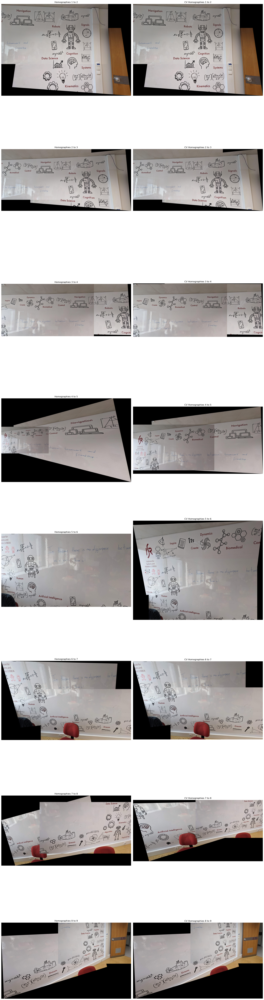

In [30]:
def stitch_pair(img1, img2, H):
    # Compute the coordinates of the four corners of img1 and img2
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    corners_img1 = np.float32([[0,0],[w1,0],[w1,h1],[0,h1]])
    corners_img2 = np.float32([[0,0],[w2,0],[w2,h2],[0,h2]])
    
    # Warp the corners of img1
    warped_corners_img1 = cv2.perspectiveTransform(corners_img1[None,:,:], H)[0]
    
    # Combine all corners to find the bounding box
    all_corners = np.vstack((warped_corners_img1, corners_img2))
    min_x, min_y = np.int32(all_corners.min(axis=0))
    max_x, max_y = np.int32(all_corners.max(axis=0))
    
    # Translate so the panorama fits in a positive coordinate space
    translation = np.eye(3, dtype=np.float32)
    translation[0, 2] = -min_x
    translation[1, 2] = -min_y
    
    # Determine the size of the canvas
    width = max_x - min_x
    height = max_y - min_y
    
    # Warp the first image into the panorama
    warped_img1 = cv2.warpPerspective(img1, translation @ H, (width, height))
    
    # Place img2 in the panorama
    panorama = warped_img1.copy()
    x_offset = -min_x
    y_offset = -min_y
    panorama[y_offset:y_offset+h2, x_offset:x_offset+w2] = img2
    
    return panorama

# Now, plot each pair with subplots
fig, axes = plt.subplots(len(images) - 1, 2, figsize=(20, 10 * (len(images) - 1)))

for i in range(len(images) - 1):
    stitched_h = stitch_pair(images[i], images[i + 1], homographies[i])
    stitched_cv = stitch_pair(images[i], images[i + 1], cv_homographies[i])
    
    axes[i, 0].imshow(stitched_h, cmap='gray')
    axes[i, 0].set_title(f'Homographies {i+1} to {i+2}')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(stitched_cv, cmap='gray')
    axes[i, 1].set_title(f'CV Homographies {i+1} to {i+2}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.savefig('homographies_output_2.png')
